In [1]:
import pandas as pd 

In [2]:
data_full=pd.read_csv('./results.csv')
data_full= data_full.drop(columns=['Unnamed: 0','Unnamed: 0.1'])
data_full.head(5)

,semantic,correct_relationships,model,CF,dataset
0,1,0.857143,forest0,FeatureTweak,credit
1,1,0.857143,forest0,FeatureTweak,credit
2,0,0.857143,forest0,FeatureTweak,credit
3,1,0.857143,forest0,FeatureTweak,credit
4,1,0.857143,forest0,FeatureTweak,credit


In [3]:
#Delete Unncessary Data
data_full=data_full[data_full!='forest']
data_full=data_full[data_full!='linear']
data_full=data_full[data_full!='MLP']
#data_full=data_full[data_full!='do_calculus']
data_full['CF'] =  data_full['CF'].replace('FeatureTweak','FT')
data_full['CF'] =  data_full['CF'].replace('causal_recourse','CR')
data_full['CF'] =  data_full['CF'].replace('do_calculus','CR-A')
data_full['CF'] =  data_full['CF'].replace('actionable_recourse','AR')
data_full['CF'] =  data_full['CF'].replace('wachter','W-CF')
data_full['CF'] =  data_full['CF'].replace('growingspheres','GS')

In [4]:
#import plotly.graph_objects as go
#import numpy as np
#from plotly.subplots import make_subplots
# First Draft Comparing different Models
#df= data_full

#data= df
#i=1
#fig = make_subplots(rows=len(np.unique(data['dataset'])), cols=1)#fig = go.Figure()
#for a in np.unique(data['dataset']):
#    d= data[data['dataset']==a].sort_values('CF')
#    fig.add_trace(go.Box(x=d["CF"], y=d["semantic"], name='semantic',fillcolor='#D3D3D3', line={'color':'black'},boxmean='sd'),row=i, col=1 )
#    fig.add_trace(go.Box(x=d["CF"], y=d["correct_relationships"],name='relationship',fillcolor='#2F4F4F',line={'color':'black'},boxmean='sd'),row=i, col=1)
#    fig.update_xaxes(title_text=f"{a}", row=i, col=1)#tickangle=30)
#    i=i+1
#fig.update_traces(width=0.5)

#fig.update_layout(
#    yaxis_title='metric',
#   boxmode='group', # group together boxes of the different traces for each value of x
#        autosize=False,
#    width=1000,
#    height=1500,
#)
#fig.update_traces(width=0.5)
#fig.update_layout(boxgroupgap=0.5, boxgap=0.1)
#fig.show()

In [5]:
import numpy as np
print(data_full['CF'])

0          FT
1          FT
2          FT
3          FT
4          FT
         ... 
14353    W-CF
14354    W-CF
14355    W-CF
14356    W-CF
14357    W-CF
Name: CF, Length: 14358, dtype: object


In [6]:
#Same Plot But Item wise : 
#TODO Apply some restictions / Make nicer ? 
import plotly.graph_objects as go
import numpy as np
np.random.seed(1)

#TODO ADD ANTOTHE COLUMN IDICATING TYPE https://community.plotly.com/t/multicategory-axis-type-example/26392
item = []
for ty in data_full['CF']:
    if ty in ['W-CF', 'GS']:
        item.append('Constraints')
    elif ty in ['CR','CR-A']:
        item.append('Causal')
    elif ty in ['cchvae','Clue','Cruds','AR']:
        item.append('Surrogate')
    elif ty in ['focus','FT']:
        item.append('Specific')
    else:
        item.append('')
data_full['item']=item
for a in np.unique(data_full['dataset']):
    print(a)
    df=data_full[data_full['dataset']==a].sort_values(['item', 'CF'])
    df=df[df['model']!='linear0']
    #df=df[df['model']!='MLP0']
    #df=df[df['model']!='MLP1']
    #print(df['model'])
    fig = go.Figure()
    fig.add_trace(go.Box(x=[df['item'],df["CF"]], y=df["semantic"], name='smo',fillcolor='#D3D3D3', line={'color':'black'},boxmean='sd') )
    fig.add_trace(go.Box(x=[df['item'],df["CF"]], y=df["correct_relationships"],name='smr', fillcolor='#2F4F4F',line={'color':'black'},boxmean='sd'))

    fig.update_layout(
        yaxis_title='metric',
        boxmode='group' # group together boxes of the different traces for each value of x
    )
    fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.01,
    
),
margin=dict(l=0,r=0,b=0,t=0),
template= 'plotly_white'
)

    fig.write_image(f"Overall_{a}.svg")
    fig.write_image(f"Overall_{a}.png")
    fig.show()

credit


economic


sanity-3-lin


sanity-3-non-add


sanity-3-non-lin


In [7]:
#Same Plot But Item wise : 
#TODO Apply some restictions / Make nicer ? 
#import plotly.graph_objects as go
#import numpy as np
#np.random.seed(1)

#TODO ADD ANTOTHE COLUMN IDICATING TYPE https://community.plotly.com/t/multicategory-axis-type-example/26392
#item = []
#for ty in data_full['CF']:
#    if ty in ['W-CF', 'GS']:
#        item.append('Constraints')
#    elif ty in ['CR','CR-A']:
#        item.append('Causal')
#    elif ty in ['cchvae','Clue','Cruds','AR']:
#        item.append('Surrogate')
#    elif ty in ['focus','FT']:
#        item.append('Specific')
#    else:
#        item.append('')
#data_full['item']=item
#for a in np.unique(data_full['dataset']):
#    print(a)
#    df=data_full[data_full['dataset']==a].sort_values(['item', 'CF'])
#    df=df[df['model']!='linear0']
#    #df=df[df['model']!='MLP0']
#    #df=df[df['model']!='MLP1']
    #print(df['model'])
#    fig = go.Figure()
#    fig.add_trace(go.Violin(x=[df['item'],df["CF"]], y=df["semantic"], name='smo',box=True,meanline_visible=True) )# fillcolor='#D3D3D3', line={'color':'black'},
#    fig.add_trace(go.Violin(x=[df['item'],df["CF"]], y=df["correct_relationships"],name='smr', box=True, meanline_visible=True))#fillcolor='#2F4F4F',line={'color':'black'},

#    fig.update_layout(
#        yaxis_title='metric',
#        boxmode='group' # group together boxes of the different traces for each value of x
#    )
    #fig.update_layout(legend=dict(
    #yanchor="top",
    #y=0.99,
    #xanchor="left",
    #x=0.01,
    
#),
#margin=dict(l=0,r=0,b=0,t=0),
#template= 'plotly_white'
#)

 #   fig.write_image(f"Overall_{a}_violin.svg")
 #   fig.write_image(f"Overall_{a}_violin.png")
 #   fig.show()

In [8]:
#DOT PLOT 
#summar_Df=  pd.read_csv('summary.csv').drop(columns=['Unnamed: 0','Unnamed: 0.1'])
#Delete Unncessary Data
#summar_Df=summar_Df[summar_Df!='forest']
#summar_Df=summar_Df[summar_Df!='linear']
#summar_Df=summar_Df[summar_Df!='MLP']
#data_full=data_full[data_full!='do_calculus']
#summar_Df['CF'] =  summar_Df['CF'].replace('FeatureTweak','FT')
#summar_Df['CF'] =  summar_Df['CF'].replace('causal_recourse','CR')
#summar_Df['CF'] =  summar_Df['CF'].replace('do_calculus','CR-A')
#summar_Df['CF'] =  summar_Df['CF'].replace('actionable_recourse','AR')
#summar_Df['CF'] =  summar_Df['CF'].replace('wachter','W-CF')
#summar_Df['CF'] =  summar_Df['CF'].replace('growingspheres','GS')
#summar_Df['CF'] =  summar_Df['CF'].replace('cchvae','CCHVAE')
#item=[]
#for ty in summar_Df['CF']:
#    if ty in ['W-CF', 'GS']:
 #       item.append('Constraints')
 #   elif ty in ['CR','CR-A']:
#        item.append('Causal')
#    elif ty in ['cchvae','Clue','Cruds','AR']:
 #       item.append('Surrogate')
#    elif ty in ['focus','FT']:
#        item.append('Specific')
#    else:
 #       item.append('')
#summar_Df['item']=item
#summar_Df=summar_Df.sort_values(['item', 'CF'])
id=[]
new_data= pd.DataFrame([])
semantic =[]
relationship=[]
semantic_ =[]
relationship_=[]
CF=[]
ty=[]
data=[]
#TODO SORT APPROACHE 
id={}
ids=[]
cat={}
i=0
summar_Df=data_full
#summar_Df=summar_Df['CF'].sort_values(['item', 'CF'])
for a in np.unique(summar_Df['CF']):
    id[a]=i
    cat[i]=summar_Df[summar_Df['CF']==a]['item'].values[0]
    i=i+1

for a in np.unique(summar_Df['dataset']):
    df_n=summar_Df[summar_Df['dataset']==a].sort_values(['item', 'CF'])   
    for cf in np.unique(df_n['CF']):
        data.append(a)
        CF.append(cf)
        
        ids.append(id[cf])
        df_n_o=df_n[df_n['CF']==cf]
        print(df_n_o['item'])
        ty.append(df_n_o['item'].values[0])
       
        semantic.append(np.mean(df_n_o['semantic']))
        relationship.append(np.mean(df_n_o["correct_relationships"]))
        semantic_.append(np.std(df_n_o['semantic']))
        relationship_.append(np.std(df_n_o["correct_relationships"]))
        i=i+1


new_data['CF']=CF
new_data['dataset']=data
new_data['semantic_mean']=semantic
new_data['semantic_std']=semantic_
new_data['relationship_mean']=relationship
new_data['relationship_std']=relationship
new_data['id']=ids
new_data['item']=ty

summar_Df.head() 
new_data.head()

85      Surrogate
86      Surrogate
87      Surrogate
88      Surrogate
89      Surrogate
          ...    
1425    Surrogate
1426    Surrogate
1427    Surrogate
1428    Surrogate
1429    Surrogate
Name: item, Length: 274, dtype: object
530     Surrogate
531     Surrogate
532     Surrogate
533     Surrogate
534     Surrogate
          ...    
1774    Surrogate
1775    Surrogate
1776    Surrogate
1777    Surrogate
1778    Surrogate
Name: item, Length: 170, dtype: object
601     Surrogate
602     Surrogate
603     Surrogate
604     Surrogate
605     Surrogate
          ...    
2024    Surrogate
2025    Surrogate
2026    Surrogate
2027    Surrogate
2028    Surrogate
Name: item, Length: 500, dtype: object
0     Specific
1     Specific
2     Specific
3     Specific
4     Specific
        ...   
80    Specific
81    Specific
82    Specific
83    Specific
84    Specific
Name: item, Length: 85, dtype: object
851     Constraints
852     Constraints
853     Constraints
854     Constraints
855   

,CF,dataset,semantic_mean,semantic_std,relationship_mean,relationship_std,id,item
0,AR,credit,0.569343,0.495168,0.857143,0.857143,0,Surrogate
1,Clue,credit,0.823529,0.381220,0.285714,0.285714,3,Surrogate
2,Cruds,credit,1.000000,0.000000,0.287429,0.287429,4,Surrogate
3,FT,credit,0.435294,0.495795,0.857143,0.857143,5,Specific
4,GS,credit,0.452000,0.497691,0.857143,0.857143,6,Constraints


In [9]:
new_data.to_csv('test.csv')

credit


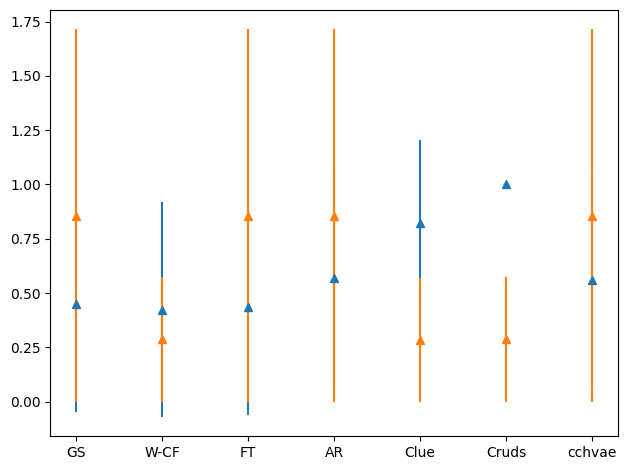

economic


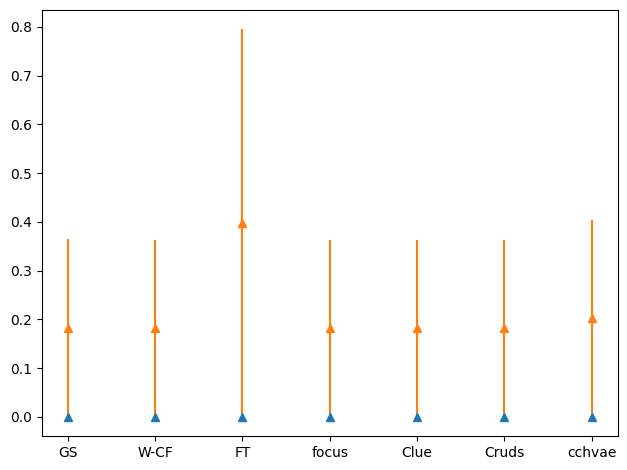

sanity-3-lin


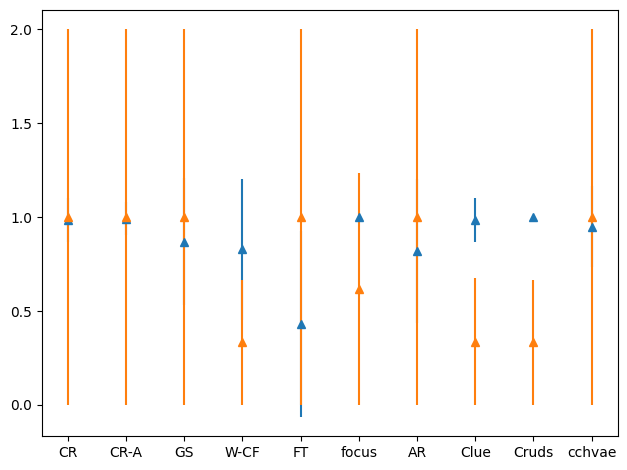

sanity-3-non-add


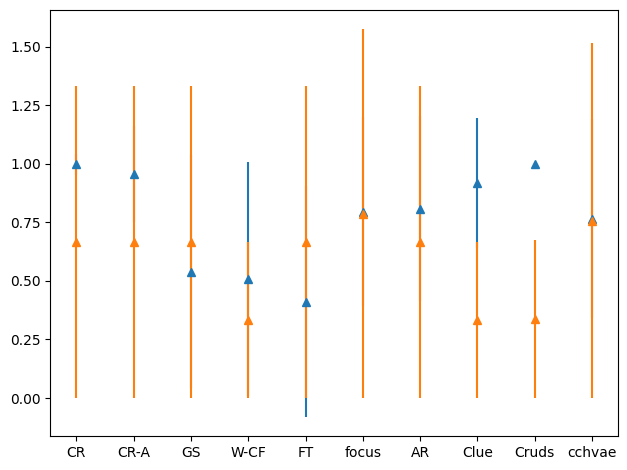

sanity-3-non-lin


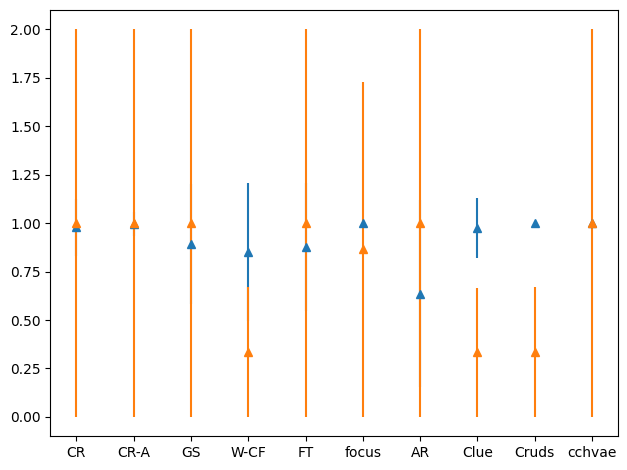

In [10]:
import matplotlib.pyplot as plt
import numpy as np
for a in np.unique(new_data['dataset']):
    print(a)
    df_n=new_data[new_data['dataset']==a].sort_values(['item', 'CF'])#'item',
    x = np.array([1, 2, 3, 4, 5])
    y = np.power(x, 2) # Effectively y = x**2
    e = np.array([1.5, 2.6, 3.7, 4.6, 5.5])

    fig, ax = plt.subplots()

    rects1 = ax.errorbar(df_n['CF'], df_n['semantic_mean'], df_n['semantic_std'], linestyle='None', marker='^')
    rects2 = ax.errorbar(df_n['CF'], df_n['relationship_mean'], df_n['relationship_std'], linestyle='None', marker='^')


    fig.tight_layout()

    plt.show()




In [11]:
import plotly.graph_objects as go

#ids=dict(ids)
#fillcolor='#D3D3D3', line={'color':'black'},boxmean='sd') )
#    fig.add_trace(go.Box(x=[df['item'],df["CF"]], y=df["correct_relationships"],name='smr', fillcolor='#2F4F4F',line={'color':'black'},boxmean='sd'))


for a in np.unique(new_data['dataset']):
    print(a)
    df_n=new_data[new_data['dataset']==a].sort_values(['item', 'CF'])#'item',
    cf_data_upper=df_n['id']+ np.ones_like(range(1,len(df_n['id'])+1))*(0.05)
    cf_data_lower=df_n['id']+ np.ones_like(range(1,len(df_n['id'])+1))*-(0.05)
    print(cf_data_lower)
#df_n['CF'],#+0.05,
    fig = go.Figure()
    fig.add_trace(go.Scatter(
        x=cf_data_lower,#df_n['CF'],#cf_data-0.05,
        y=df_n['semantic_mean'],
        marker=dict(color='#D3D3D3', size=12),
        mode="markers",
        name="smo",
        error_y=dict(
            type='data', # value of error bar given in data coordinates
            array=df_n["semantic_std"],
            visible=True)
    ))
        #df_n["semantic_std"], error_y_minus=-df_n["semantic_std"]
   # ))
#df_n['CF'], #-0.05
    fig.add_trace(go.Scatter(
        x=cf_data_upper,#df_n['CF']+'a',#cf_data+0.05,
        y=df_n['relationship_mean'],
        marker=dict(color='#2F4F4F', size=12, symbol ='square' ),
        mode="markers",
        name="smr",
        error_y=dict(
            type='data', # value of error bar given in data coordinates
            array=df_n["relationship_std"],
            visible=True)
    ))
        #error_y=df_n["relationship__std"], 
        #error_y_minus=-df_n["relationship_std"]
    #))


#fig.update_layout(title="Gender Earnings Disparity",
                  #xaxis_title="Annual Salary (in thousands)",
                  #yaxis_title="School")
    #ig.update_xaxes(categoryarray=<VALUE>)
    print(cat.values())
    print(id.keys())
    fig.update_layout(yaxis_range=[-0.1,1.1])
    fig.update_layout(
        yaxis_title='metric',
        scattermode="group" # group together boxes of the different traces for each value of x
    )
    fig.update_layout(
    xaxis=dict(
        tickmode='array',
        tickvals=list(id.values()),
        ticktext=list(id.keys()),
        categoryarray=list(cat.values())
    ))
    fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.01,
    
    ),
    margin=dict(l=0,r=0,b=0,t=0),
    template= 'plotly_white'
    )

    fig.write_image(f"Overall_{a}_dot.svg")
    fig.write_image(f"Overall_{a}_dot.png")
    fig.show()

credit
4    5.95
5    6.95
3    4.95
0   -0.05
1    2.95
2    3.95
6    7.95
Name: id, dtype: float64
dict_values(['Surrogate', 'Causal', 'Causal', 'Surrogate', 'Surrogate', 'Specific', 'Constraints', 'Constraints', 'Surrogate', 'Specific'])
dict_keys(['AR', 'CR', 'CR-A', 'Clue', 'Cruds', 'FT', 'GS', 'W-CF', 'cchvae', 'focus'])


economic
10    5.95
11    6.95
9     4.95
13    8.95
7     2.95
8     3.95
12    7.95
Name: id, dtype: float64
dict_values(['Surrogate', 'Causal', 'Causal', 'Surrogate', 'Surrogate', 'Specific', 'Constraints', 'Constraints', 'Surrogate', 'Specific'])
dict_keys(['AR', 'CR', 'CR-A', 'Clue', 'Cruds', 'FT', 'GS', 'W-CF', 'cchvae', 'focus'])


sanity-3-lin
15    0.95
16    1.95
20    5.95
21    6.95
19    4.95
23    8.95
14   -0.05
17    2.95
18    3.95
22    7.95
Name: id, dtype: float64
dict_values(['Surrogate', 'Causal', 'Causal', 'Surrogate', 'Surrogate', 'Specific', 'Constraints', 'Constraints', 'Surrogate', 'Specific'])
dict_keys(['AR', 'CR', 'CR-A', 'Clue', 'Cruds', 'FT', 'GS', 'W-CF', 'cchvae', 'focus'])


sanity-3-non-add
25    0.95
26    1.95
30    5.95
31    6.95
29    4.95
33    8.95
24   -0.05
27    2.95
28    3.95
32    7.95
Name: id, dtype: float64
dict_values(['Surrogate', 'Causal', 'Causal', 'Surrogate', 'Surrogate', 'Specific', 'Constraints', 'Constraints', 'Surrogate', 'Specific'])
dict_keys(['AR', 'CR', 'CR-A', 'Clue', 'Cruds', 'FT', 'GS', 'W-CF', 'cchvae', 'focus'])


sanity-3-non-lin
35    0.95
36    1.95
40    5.95
41    6.95
39    4.95
43    8.95
34   -0.05
37    2.95
38    3.95
42    7.95
Name: id, dtype: float64
dict_values(['Surrogate', 'Causal', 'Causal', 'Surrogate', 'Surrogate', 'Specific', 'Constraints', 'Constraints', 'Surrogate', 'Specific'])
dict_keys(['AR', 'CR', 'CR-A', 'Clue', 'Cruds', 'FT', 'GS', 'W-CF', 'cchvae', 'focus'])


# BELOW HERE TESTING / EXPERIMENTAL STUFF

## Plots for RQ 2

In [12]:
# Semantic Meaningfulness in Comparison to accuracy of classifier 
# Scatter Plot ? 
import os
import torch
from string import digits
import re
import sklearn
import numpy as np
from carla.data.catalog import CsvCatalog
import pandas as pd
model_name=['0']
accuracy=['0']
precision=['0']
recall=['0']
auc=['0']
df=pd.DataFrame([])

for name in os.listdir('./Model/'):
    #print(name.split('.')[0][-1].isdigit())
    #print(name)
    if name.split('.')[0][-1].isdigit() or name.startswith('Linear')or name.startswith('Forest'):
        full_name=name
        model=torch.load(f'./Model/{name}')
        name=name.split('_')[1]
        name=name.replace('.pth','')
        #print('FIRST',name)
        #print(name[:-1])
        if name[-1].isdigit():
            name=name[:-1]
        #print('Second',name)

        dataset = pd.read_csv(f'../data/{name}/{name}.csv')
        continuous_wachter = dataset.drop(columns=['label']).columns
        scaler='Identity'
        if name == 'economic':
            scaler='MinMax'

        dataset = CsvCatalog(file_path=f'../data/{name}/{name}.csv',
                     continuous=continuous_wachter,
                     categorical=[],
                     immutables=[],
                     target='label',
                     scaling_method=scaler)
        dataset=dataset._df_test
        data_x, data_y=dataset.drop(columns=['label']), dataset['label']
        data_pred= model.predict(data_x)
        model_name.append(full_name)
        print(data_pred.shape)
        print(data_y.shape)
        if len(data_pred.shape)>1:
            data_pred= np.argmax(data_pred, axis=1)

        accuracy.append(sklearn.metrics.accuracy_score(data_y,data_pred))
        precision.append(sklearn.metrics.precision_score(data_y,data_pred))
        recall.append(sklearn.metrics.recall_score(data_y,data_pred))
        auc.append(sklearn.metrics.roc_auc_score(data_y,data_pred))
df['model_name']=model_name
#df['accuracy']=accuracy
#df['precision']=precision
#df['recall']=recall
df['auc'] =auc
df=df.iloc[1:]
df

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning:

Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning:

Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning:

Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:5

[INFO] Using Python-MIP package version 1.12.0 [model.py <module>]


/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/tensorboard/compat/tensorflow_stub/dtypes.py:541: FutureWarning:

Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/tensorboard/compat/tensorflow_stub/dtypes.py:542: FutureWarning:

Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/tensorboard/compat/tensorflow_stub/dtypes.py:543: FutureWarning:

Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/tensorboard/compat

(2500,)
(2500,)
(2500,)
(2500,)
(2500,)
(2500,)
(2500,)
(2500,)
(2500,)
(2500,)
(2500, 2)
(2500,)


/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/carla/models/catalog/Linear_TORCH/model_linear.py:34: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/carla/models/catalog/Linear_TORCH/model_linear.py:34: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/carla/models/catalog/Linear_TORCH/model_linear.py:34: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/carla/models/catalog/Linear_TORCH/model_linear.py:34: UserWarning:

Implicit dimension choice for softmax has been deprecated. Ch

(2500, 2)
(2500,)
(2500, 2)
(2500,)
(2500, 2)
(2500,)
(2500, 2)
(2500,)
(2500, 2)
(2500,)
(2500, 2)
(2500,)
(2500, 2)
(2500,)
(2500, 2)
(2500,)
(2500, 2)
(2500,)


/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/carla/models/catalog/ANN_TORCH/model_ann.py:56: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/carla/models/catalog/ANN_TORCH/model_ann.py:56: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/carla/models/catalog/ANN_TORCH/model_ann.py:56: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/carla/models/catalog/ANN_TORCH/model_ann.py:56: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include

,model_name,auc
1,Forest_credit.pth,0.807559
2,Forest_economic.pth,0.797684
3,Forest_sanity-3-lin.pth,0.8064
4,Forest_sanity-3-non-add.pth,0.744878
5,Forest_sanity-3-non-lin.pth,0.968658
6,Linear_credit.pth,0.764165
7,Linear_economic.pth,0.820964
8,Linear_sanity-3-lin.pth,0.994916
9,Linear_sanity-3-non-add.pth,0.99814
10,Linear_sanity-3-non-lin.pth,0.997359


In [13]:
# Delete First Row 
smo=[]
smr=[]
data=data_full
# Attach smo, smr 
m=[]
for name in df['model_name']:
    name=name.replace('.pth','')
    a=name.split('_')
    if a[0]=='Forest':
        d=data[data['model']=='forest']
        d=d[d['dataset']==a[1]]
        m.append('Forest')
    if a[0]=='Linear':
        d=data[data['model']=='linear']
        d=d[d['dataset']==a[1]]
        m.append('Linear')
    if a[0]=='MLP':
        if int(a[1][-1])==0:
            d=data[data['model']=='MLP0']
            d=d[d['dataset']==a[1][:-1]]
            m.append('MLP_0')
        if int(a[1][-1])==1:
            d=data[data['model']=='MLP1']
            d=d[d['dataset']==a[1][:-1]]
            m.append('MLP_1')
        if int(a[1][-1])==2:
            d=data[data['model']=='MLP2']
            d=d[d['dataset']==a[1][:-1]]
            m.append('MLP_2')

        #Average results 
    smo.append(np.mean(d['semantic']))
    smr.append(np.mean(d["correct_relationships"]))
df['smo']=smo
df['smr']=smr
df['m']=m

## Averaged Results 
It Can be ssen that in most cases higher AUC also leafs to higher smr / smo --> Naming outliers is probably inetersting ! Maybe do this appraoch wise ? 

In [14]:
import plotly.express as px

fig = px.scatter(df, x="smr", y="auc",color="m")
fig.show()

In [15]:
import plotly.express as px

fig = px.scatter(df, x="smo", y="auc",color="m")
fig.show()

### Approach Wise Averaged Results

In [16]:
# Delete First Row 
smo=[]
smr=[]
acc=[]
data=data_full
df_new=pd.DataFrame([])
# Attach smo, smr 
m=[]
approach=[]
for name in df['model_name']:
    name=name.replace('.pth','')
    a=name.split('_')
    if a[0]=='Forest':
        d=data[data['model']=='forest']
        d=d[d['dataset']==a[1]]
        for cf in np.unique(d['CF']):
            d_cf=d[d['CF']==cf]
            smo.append(np.mean(d_cf['semantic']))
            smr.append(np.mean(d_cf["correct_relationships"]))
            m.append('Forest')
            approach.append(cf)
            #print(name)
            #print(df[df['model_name']==name]['auc'])
            acc.append(df[df['model_name']==name+'.pth']['auc'].values[0])

    if a[0]=='Linear':
        d=data[data['model']=='linear']
        d=d[d['dataset']==a[1]]
        for cf in np.unique(d['CF']):
            d_cf=d[d['CF']==cf]
            smo.append(np.mean(d_cf['semantic']))
            smr.append(np.mean(d_cf["correct_relationships"]))
            m.append('Linear')
            approach.append(cf)
            #print(name)
            #print(df[df['model_name']==name]['auc'])
            acc.append(df[df['model_name']==name+'.pth']['auc'].values[0])
    if a[0]=='MLP':
        if int(a[1][-1])==0:
            d=data[data['model']=='MLP0']
            d=d[d['dataset']==a[1][:-1]]
            
            for cf in np.unique(d['CF']):
                d_cf=d[d['CF']==cf]
                smo.append(np.mean(d_cf['semantic']))
                smr.append(np.mean(d_cf["correct_relationships"]))
                m.append('MLP_0')
                approach.append(cf)
                #print(name)
                #print(df[df['model_name']==name]['auc'])
                acc.append(df[df['model_name']==name+'.pth']['auc'].values[0])
        if int(a[1][-1])==1:
            d=data[data['model']=='MLP1']
            d=d[d['dataset']==a[1][:-1]]
        
            for cf in np.unique(d['CF']):
                d_cf=d[d['CF']==cf]
                smo.append(np.mean(d_cf['semantic']))
                smr.append(np.mean(d_cf["correct_relationships"]))
                m.append('MLP_1')
                approach.append(cf)
                #print(name)
                #print(df[df['model_name']==name]['auc'])
                acc.append(df[df['model_name']==name+'.pth']['auc'].values[0])
        if int(a[1][-1])==2:
            d=data[data['model']=='MLP2']
            d=d[d['dataset']==a[1][:-1]]
    
            for cf in np.unique(d['CF']):
                d_cf=d[d['CF']==cf]
                smo.append(np.mean(d_cf['semantic']))
                smr.append(np.mean(d_cf["correct_relationships"]))
                m.append('MLP_2')
                approach.append(cf)
                #print(name)
                #print(df[df['model_name']==name]['auc'])
                acc.append(df[df['model_name']==name+'.pth']['auc'].values[0])

        #Average results 
    #smo.append(np.mean(d['semantic']))
    #smr.append(np.mean(d["correct_relationships"]))

df_new['smo']=smo
df_new['smr']=smr
df_new['m']=m
df_new['cf']=approach
df_new['auc']=acc

In [17]:
df_new

,smo,smr,m,cf,auc
0,0.822785,0.857143,MLP_0,AR,0.677016
1,0.939394,0.285714,MLP_0,Clue,0.677016
2,1.000000,0.288000,MLP_0,Cruds,0.677016
3,0.492000,0.857143,MLP_0,GS,0.677016
4,0.350785,0.285714,MLP_0,W-CF,0.677016
5,0.844000,0.857143,MLP_0,cchvae,0.677016
6,0.000000,0.181818,MLP_0,Cruds,0.818565
7,0.000000,0.181818,MLP_0,GS,0.818565
8,0.000000,0.181818,MLP_0,W-CF,0.818565
9,0.000000,0.203636,MLP_0,cchvae,0.818565


In [18]:
import plotly.express as px
#TODO Why are forest based measures missing?
##CCHVAE Performs well for goof performing Classifier
## Causal Recourse also dependeny to good performance
## For loe performing Classifier most approaches < 0.8 perform semantically not well 

## CLue Wachter ---

fig = px.scatter(df_new, x="smr", y="auc",color="cf",symbol="cf",trendline="ols")
fig.update_layout(
    autosize=False,
    width=800,
    height=500,
margin=dict(l=0,r=0,b=0,t=0),
template= 'plotly_white'
)
fig.write_image(f"AUCvsSMR.svg")
fig.write_image(f"AUCvsSMR.png")
fig.show()

In [ ]:
import plotly.express as px

fig = px.scatter(df_new, x="smo", y="auc",color="cf",symbol="cf",trendline="ols")

fig.update_layout(
    autosize=False,
    width=800,
    height=500,
margin=dict(l=0,r=0,b=0,t=0),
template= 'plotly_white'
)
fig.write_image(f"AUCvsSM0.svg")
fig.write_image(f"AUCvsSM0.png")
fig.show()

In [26]:
import plotly.express as px

acc=pd.read_csv('Classifier_results.csv')

df=data_full

for a in np.unique(df['dataset']):
    df_d=df[df['dataset']==a]
    acc_d= acc[acc['dataset']==a]
    acc_d['model']=acc_d['model'].replace('Forest', 'forest0')
    acc_d['model']=acc_d['model'].replace('linear', 'linear0')
    #print(df_d)
    #print(acc_d)
    df_d=df_d.merge(acc_d)
    #print(df_d.columns)

    fig = px.scatter(df_d, x="semantic", y="auc",color="CF",trendline="ols")

#fig.update_layout(
#    autosize=False,
#    width=800,
#    height=500,
#margin=dict(l=0,r=0,b=0,t=0),
#template= 'plotly_white'
#)
    fig.write_image(f"AUCvsSM0_{a}.svg")
    fig.write_image(f"AUCvsSM0_{a}.png")
    fig.show()

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1752: RuntimeWarning:

divide by zero encountered in double_scalars

/home

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1752: RuntimeWarning:

divide by zero encountered in double_scalars

/home

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1752: RuntimeWarning:

divide by zero encountered in double_scalars

/home

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1752: RuntimeWarning:

divide by zero encountered in double_scalars

/home

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1752: RuntimeWarning:

divide by zero encountered in double_scalars

/home

In [27]:
import plotly.express as px

acc=pd.read_csv('Classifier_results.csv')

df=data_full

for a in np.unique(df['dataset']):
    df_d=df[df['dataset']==a]
    acc_d= acc[acc['dataset']==a]
    acc_d['model']=acc_d['model'].replace('Forest', 'forest0')
    acc_d['model']=acc_d['model'].replace('linear', 'linear0')
    #print(df_d)
    #print(acc_d)
    df_d=df_d.merge(acc_d)
    #print(df_d.columns)

    fig = px.scatter(df_d, x="correct_relationships", y="auc",color="CF",trendline="ols")

#fig.update_layout(
#    autosize=False,
#    width=800,
#    height=500,
#margin=dict(l=0,r=0,b=0,t=0),
#template= 'plotly_white'
#)
    fig.write_image(f"AUCvsSMR_{a}.svg")
    fig.write_image(f"AUCvsSMR_{a}.png")
    fig.show()

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1752: RuntimeWarning:

divide by zero encountered in double_scalars

/home

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1752: RuntimeWarning:

invalid value encountered in double_scalars

/home/

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1752: RuntimeWarning:

divide by zero encountered in double_scalars

/home

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1752: RuntimeWarning:

divide by zero encountered in double_scalars

/home

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1752: RuntimeWarning:

divide by zero encountered in double_scalars

/home

### Influence Model Type




In [ ]:
import plotly.graph_objects as go
import numpy as np
np.random.seed(1)

df=data_full.sort_values('model')
df['model'] =  df['model'].replace('forest0','Forest')
df['model'] =  df['model'].replace('linear0','linear')
df['model']=  df['model'].replace('MLP0','MLP_0')
df['model'] =  df['model'].replace('MLP1','MLP_1')
df['model'] =  df['model'].replace('MLP2','MLP_2')


fig = go.Figure()
fig.add_trace(go.Box(x=df["model"], y=df["semantic"], name='semantic',boxmean='sd') )
fig.add_trace(go.Box(x=df["model"], y=df["correct_relationships"],name='relationship',boxmean='sd'))

fig.update_layout(
    boxmode='group', # group together boxes of the different traces for each value of x
    template= 'plotly_white',
    margin=dict(l=0,r=0,b=0,t=0),
)
fig.write_image(f"SplitModel.svg")
fig.write_image(f"SplitModel.png")
fig.show()

In [ ]:
new_data= data_full
for a in np.unique(new_data['dataset']):
    print(a)
    df=new_data[new_data['dataset']==a].sort_values(['item', 'CF'])#'item',
    df=df.sort_values('model')
    df['model'] =  df['model'].replace('forest0','Forest')
    df['model'] =  df['model'].replace('linear0','linear')
    df['model']=  df['model'].replace('MLP0','MLP_0')
    df['model'] =  df['model'].replace('MLP1','MLP_1')
    df['model'] =  df['model'].replace('MLP2','MLP_2')


    fig = go.Figure()
    fig.add_trace(go.Box(x=df["model"], y=df["semantic"], name='semantic',boxmean='sd') )
    fig.add_trace(go.Box(x=df["model"], y=df["correct_relationships"],name='relationship',boxmean='sd'))

    fig.update_layout(
    boxmode='group', # group together boxes of the different traces for each value of x
    template= 'plotly_white',
    margin=dict(l=0,r=0,b=0,t=0),
    )
    fig.write_image(f"SplitModel_{a}.svg")
    fig.write_image(f"SplitModel_{a}.png")
    fig.show()

credit


economic


sanity-3-lin


sanity-3-non-add


sanity-3-non-lin


## Q3 Connection between SMO and SMR

In [ ]:
import plotly.express as px
fig = px.scatter(x=data_full['semantic'], y=data_full["correct_relationships"],trendline="ols")
fig.update_layout(
        yaxis_title='smr',
        xaxis_title='smo',
        template= 'plotly_white',
        margin=dict(l=0,r=0,b=0,t=0),
    )
fig.write_image(f"SMOvsSMR.svg")
fig.show()

In [ ]:
# library
import matplotlib.pyplot as plt
from matplotlib_venn import venn2
data=pd.read_csv('./Venn.csv')
# Use the venn2 function
venn2(subsets = (10, 5, 2), set_labels = ('Group A', 'Group B'))
plt.show()

In [ ]:
# Calculates Validity

# Claculate smo

In [ ]:
import plotly.graph_objects as go

fig = go.Figure()

# Create scatter trace of text labels
fig.add_trace(go.Scatter(
    x=[1, 1.75, 2.5],
    y=[1, 1, 1],
    text=["$A$", "$A+B$", "$B$"],
    mode="text",
    textfont=dict(
        color="black",
        size=18,
        family="Arail",
    )
))

# Update axes properties
fig.update_xaxes(
    showticklabels=False,
    showgrid=False,
    zeroline=False,
)

fig.update_yaxes(
    showticklabels=False,
    showgrid=False,
    zeroline=False,
)

# Add circles
fig.add_shape(type="circle",
    line_color="blue", fillcolor="blue",
    x0=0, y0=0, x1=2, y1=2
)
fig.add_shape(type="circle",
    line_color="gray", fillcolor="gray",
    x0=1.5, y0=0, x1=3.5, y1=2
)
fig.update_shapes(opacity=0.3, xref="x", yref="y")

fig.update_layout(
    margin=dict(l=20, r=20, b=100),
    height=600, width=800,
    plot_bgcolor="white"
)

fig.show()


## Random Plots

In [ ]:
import plotly.graph_objects as go
import numpy as np
np.random.seed(1)

fig = go.Figure()
fig.add_trace(go.Box(x=df["dataset"], y=df["semantic"], name='semantic') )
fig.add_trace(go.Box(x=df["dataset"], y=df["correct_relationships"],name='relationship'))

fig.update_layout(
    yaxis_title='normalized moisture',
    boxmode='group' # group together boxes of the different traces for each value of x
)

fig.show()

In [ ]:
import plotly.graph_objects as go
import numpy as np
np.random.seed(1)

fig = go.Figure()
fig.add_trace(go.Box(x=df["CF"], y=df["semantic"], name='semantic') )
fig.add_trace(go.Box(x=df["CF"], y=df["correct_relationships"],name='relationship'))

fig.update_layout(
    yaxis_title='metric',
    boxmode='group' # group together boxes of the different traces for each value of x
)

fig.show()

In [ ]:
# Just show mean 
pd.read_csv('./summary.csv')


,Unnamed: 0,Unnamed: 0.1,model,dataset,CF,semantic_mean,semantic_std,relationship_mean,relationship_std
0,0,0,forest0,credit,FeatureTweak,0.435294,0.495795,0.857143,1.110223e-16
1,0,0,linear0,credit,actionable_recourse,0.466667,0.498888,0.857143,0.000000e+00
2,0,0,linear0,credit,cchvae,0.272000,0.444990,0.857143,0.000000e+00
3,0,0,linear0,credit,Clue,0.661972,0.473038,0.285714,1.665335e-16
4,0,0,linear0,credit,Cruds,1.000000,0.000000,0.286857,1.272632e-02
...,...,...,...,...,...,...,...,...,...
74,0,0,MLP0,sanity-3-non-lin,Clue,0.953488,0.210590,0.333333,5.551115e-17
75,0,0,MLP0,sanity-3-non-lin,Cruds,1.000000,0.000000,0.334842,2.237164e-02
76,0,0,MLP0,sanity-3-non-lin,do_calculus,0.996000,0.063119,1.000000,0.000000e+00
77,0,0,MLP0,sanity-3-non-lin,growingspheres,0.796000,0.402969,1.000000,0.000000e+00


In [ ]:
import plotly.express as px
fig = px.scatter(x=df['semantic'], y=df["correct_relationships"])
fig.show()

# Splitted Up According to Model

In [ ]:
'''Only Forest Data'''
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.graph_objects as go
import numpy as np
np.random.seed(1)
data= df[df['model']=='forest']
i=1
fig = make_subplots(rows=1, cols=len(np.unique(data['dataset'])))#fig = go.Figure()
for a in np.unique(data['dataset']):
    d= data[data['dataset']==a].sort_values('CF')
    fig.add_trace(go.Box(x=d["CF"], y=d["semantic"], name='semantic'),row=1, col=i )
    fig.add_trace(go.Box(x=d["CF"], y=d["correct_relationships"],name='relationship'),row=1, col=i )
    fig.update_xaxes(title_text=f"{a}", row=1, col=i)
    i=i+1
   

fig.update_layout(
    yaxis_title='metric',
    boxmode='group' # group together boxes of the different traces for each value of x
)

fig.show()

ValueError: 
The 'cols' argument to make_suplots must be an int greater than 0.
    Received value of type <class 'int'>: 0

In [ ]:
'''Only Linear Data'''

from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.graph_objects as go
import numpy as np
np.random.seed(1)
data= df[df['model']=='linear']
i=1
fig = make_subplots(rows=1, cols=len(np.unique(data['dataset'])))#fig = go.Figure()
for a in np.unique(data['dataset']):
    d= data[data['dataset']==a].sort_values('CF')
    fig.add_trace(go.Box(x=d["CF"], y=d["semantic"], name='semantic'),row=1, col=i )
    fig.add_trace(go.Box(x=d["CF"], y=d["correct_relationships"],name='relationship'),row=1, col=i )
    fig.update_xaxes(title_text=f"{a}", row=1, col=i)
    i=i+1
    

fig.update_layout(
    yaxis_title='metric',
    boxmode='group' # group together boxes of the different traces for each value of x
)

fig.show()

In [ ]:
'''MLP'''
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.graph_objects as go
import numpy as np
np.random.seed(1)
data= df[df['model']=='MLP0']
i=1
fig = make_subplots(rows=1, cols=len(np.unique(data['dataset'])))#fig = go.Figure()
for a in np.unique(data['dataset']):
    d= data[data['dataset']==a].sort_values('CF')
    fig.add_trace(go.Box(x=d["CF"], y=d["semantic"], name='semantic'),row=1, col=i )
    fig.add_trace(go.Box(x=d["CF"], y=d["correct_relationships"],name='relationship'),row=1, col=i )
    fig.update_xaxes(title_text=f"{a}", row=1, col=i)
    i=i+1
    

fig.update_layout(
    yaxis_title='metric',
    boxmode='group' # group together boxes of the different traces for each value of x
)

fig.show()

# Splitted Up According to DatasetType 

In [ ]:
#Credit 
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.graph_objects as go
import numpy as np
np.random.seed(1)
data= df[df['dataset']=='credit']
i=1
fig = make_subplots(rows=1, cols=len(np.unique(data['model'])))#fig = go.Figure()
for a in np.unique(data['model']):
    d= data[data['model']==a].sort_values('CF')
    fig.add_trace(go.Box(x=d["CF"], y=d["semantic"], name='semantic'),row=1, col=i )
    fig.add_trace(go.Box(x=d["CF"], y=d["correct_relationships"],name='relationship'),row=1, col=i )
    fig.update_xaxes(title_text=f"{a}", row=1, col=i)
    i=i+1
    

fig.update_layout(
    yaxis_title='metric',
    boxmode='group' # group together boxes of the different traces for each value of x
)

fig.show()

In [ ]:
#Credit 
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.graph_objects as go
import numpy as np
np.random.seed(1)
data= df[df['dataset']=='sanity-3-lin']
i=1
fig = make_subplots(rows=1, cols=len(np.unique(data['model'])))#fig = go.Figure()
for a in np.unique(data['model']):
    d= data[data['model']==a].sort_values('CF')
    fig.add_trace(go.Box(x=d["CF"], y=d["semantic"], name='semantic'),row=1, col=i )
    fig.add_trace(go.Box(x=d["CF"], y=d["correct_relationships"],name='relationship'),row=1, col=i )
    fig.update_xaxes(title_text=f"{a}", row=1, col=i)
    i=i+1
    

fig.update_layout(
    yaxis_title='metric',
    boxmode='group' # group together boxes of the different traces for each value of x
)

fig.show()

In [ ]:
#Credit 
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.graph_objects as go
import numpy as np
np.random.seed(1)
data= df[df['dataset']=='sanity-3-non-lin']
i=1
fig = make_subplots(rows=1, cols=len(np.unique(data['model'])))#fig = go.Figure()
for a in np.unique(data['model']):
    d= data[data['model']==a].sort_values('CF')
    fig.add_trace(go.Box(x=d["CF"], y=d["semantic"], name='semantic'),row=1, col=i )
    fig.add_trace(go.Box(x=d["CF"], y=d["correct_relationships"],name='relationship'),row=1, col=i )
    fig.update_xaxes(title_text=f"{a}", row=1, col=i)
    i=i+1
    

fig.update_layout(
    yaxis_title='metric',
    boxmode='group' # group together boxes of the different traces for each value of x
)

fig.show()

In [ ]:
#Credit 
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.graph_objects as go
import numpy as np
np.random.seed(1)
data= df[df['dataset']=='sanity-3-non-add']
i=1
fig = make_subplots(rows=1, cols=len(np.unique(data['model'])))#fig = go.Figure()
for a in np.unique(data['model']):
    d= data[data['model']==a].sort_values('CF')
    fig.add_trace(go.Box(x=d["CF"], y=d["semantic"], name='semantic'),row=1, col=i )
    fig.add_trace(go.Box(x=d["CF"], y=d["correct_relationships"],name='relationship'),row=1, col=i )
    fig.update_xaxes(title_text=f"{a}", row=1, col=i)
    i=i+1
    

fig.update_layout(
    yaxis_title='metric',
    boxmode='group' # group together boxes of the different traces for each value of x
)

fig.show()

In [ ]:
# First Draft Comparing different Models
df= data_full
np.random.seed(1)
data= df[df['dataset']=='sanity-3-non-lin']
i=1
fig = make_subplots(rows=1, cols=len(np.unique(data['model'])))#fig = go.Figure()
for a in np.unique(data['model']):
    d= data[data['model']==a].sort_values('CF')
    fig.add_trace(go.Box(x=d["CF"], y=d["semantic"], name='semantic'),row=1, col=i )
    fig.add_trace(go.Box(x=d["CF"], y=d["correct_relationships"],name='relationship'),row=1, col=i )
    fig.update_xaxes(title_text=f"{a}", row=1, col=i)
    i=i+1
    

fig.update_layout(
    yaxis_title='metric',
    boxmode='group' # group together boxes of the different traces for each value of x
)

fig.show()

# Metrics in Comparison to Classification Capeabilities

(2500,)
(2500,)
(2500,)
(2500,)
(2500,)
(2500,)
(2500,)
(2500,)
(2500,)
(2500,)


/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/carla/models/catalog/Linear_TORCH/model_linear.py:34: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  output = self.softmax(output)
/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/carla/models/catalog/Linear_TORCH/model_linear.py:34: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  output = self.softmax(output)
/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/carla/models/catalog/Linear_TORCH/model_linear.py:34: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  output = self.softmax(output)
/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/carla/models/catalog/Linear_TORCH/model

(2500, 2)
(2500,)
(2500, 2)
(2500,)
(2500, 2)
(2500,)
(2500, 2)
(2500,)
(2500, 2)
(2500,)
(2500, 2)
(2500,)


/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/carla/models/catalog/ANN_TORCH/model_ann.py:56: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  x = self.softmax(x)
/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/carla/models/catalog/ANN_TORCH/model_ann.py:56: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  x = self.softmax(x)
/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/carla/models/catalog/ANN_TORCH/model_ann.py:56: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  x = self.softmax(x)
/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defin

(2500, 2)
(2500,)
(2500, 2)
(2500,)
(2500, 2)
(2500,)
(2500, 2)
(2500,)


/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/carla/models/catalog/ANN_TORCH/model_ann.py:56: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  x = self.softmax(x)
/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/carla/models/catalog/ANN_TORCH/model_ann.py:56: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  x = self.softmax(x)
/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/carla/models/catalog/ANN_TO

(2500, 2)
(2500,)
(2500, 2)
(2500,)
(2500, 2)
(2500,)
(2500, 2)
(2500,)
(2500, 2)
(2500,)
(2500, 2)
(2500,)
(2500, 2)
(2500,)
(2500, 2)
(2500,)
(2500, 2)
(2500,)
(2500, 2)
(2500,)


/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/carla/models/catalog/ANN_TORCH/model_ann.py:56: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  x = self.softmax(x)
/home/jacqueline/.local/share/virtualenvs/CARLA-7s4zdYsf/lib/python3.7/site-packages/carla/models/catalog/ANN_TORCH/model_ann.py:56: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  x = self.softmax(x)


,model_name,accuracy,precision,recall,auc
0,0,0,0,0,0
1,Forest_credit.pth,0.806,0.827386,0.782575,0.806459
2,Forest_economic.pth,0.8168,0.763636,0.826617,0.818054
3,Forest_sanity-3-lin.pth,0.804,0.822311,0.794457,0.804389
4,Forest_sanity-3-non-add.pth,0.8604,0.928571,0.489796,0.738457
5,Forest_sanity-3-non-lin.pth,0.9732,0.977797,0.96543,0.972822
6,Linear_credit.pth,0.7676,0.783461,0.73756,0.767504
7,Linear_economic.pth,0.3536,0.336943,0.479167,0.366732
8,Linear_sanity-3-lin.pth,0.9956,0.998424,0.992947,0.995656
9,Linear_sanity-3-non-add.pth,1,1,1,1
